In [1]:
# Import necessary libraries
import xarray as xr
import pandas as pd
import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime

In [2]:
cd /Users/usmanc18/Desktop/FETCH/data

/Users/usmanc18/Desktop/FETCH/data


In [3]:
ls

2022-09-01.local.nc  2023-05-21.local.nc  2024-01-05.local.nc
2022-09-02.local.nc  2023-05-22.local.nc  2024-01-06.local.nc
2022-09-03.local.nc  2023-05-23.local.nc  2024-01-07.local.nc
2022-09-04.local.nc  2023-05-24.local.nc  2024-01-08.local.nc
2022-09-05.local.nc  2023-05-25.local.nc  2024-01-09.local.nc
2022-09-06.local.nc  2023-05-26.local.nc  2024-01-10.local.nc
2022-09-07.local.nc  2023-05-27.local.nc  2024-01-11.local.nc
2022-09-08.local.nc  2023-05-28.local.nc  2024-01-12.local.nc
2022-09-09.local.nc  2023-05-29.local.nc  2024-01-13.local.nc
2022-09-10.local.nc  2023-05-30.local.nc  2024-01-14.local.nc
2022-09-11.local.nc  2023-05-31.local.nc  2024-01-15.local.nc
2022-09-12.local.nc  2023-06-01.local.nc  2024-01-16.local.nc
2022-09-13.local.nc  2023-06-02.local.nc  2024-01-17.local.nc
2022-09-14.local.nc  2023-06-03.local.nc  2024-01-18.local.nc
2022-09-15.local.nc  2023-06-04.local.nc  2024-01-19.local.nc
2022-09-16.local.nc  2023-06-05.local.nc  2024-01-20.local.nc
2022-09-

In [4]:
import glob
import os

# List all .nc files in the directory that contain 'local'
files = sorted(glob.glob('*.local.nc'))
files

['2022-09-01.local.nc',
 '2022-09-02.local.nc',
 '2022-09-03.local.nc',
 '2022-09-04.local.nc',
 '2022-09-05.local.nc',
 '2022-09-06.local.nc',
 '2022-09-07.local.nc',
 '2022-09-08.local.nc',
 '2022-09-09.local.nc',
 '2022-09-10.local.nc',
 '2022-09-11.local.nc',
 '2022-09-12.local.nc',
 '2022-09-13.local.nc',
 '2022-09-14.local.nc',
 '2022-09-15.local.nc',
 '2022-09-16.local.nc',
 '2022-09-17.local.nc',
 '2022-09-18.local.nc',
 '2022-09-19.local.nc',
 '2022-09-20.local.nc',
 '2022-09-21.local.nc',
 '2022-09-22.local.nc',
 '2022-09-23.local.nc',
 '2022-09-24.local.nc',
 '2022-09-25.local.nc',
 '2022-09-26.local.nc',
 '2022-09-27.local.nc',
 '2022-09-28.local.nc',
 '2022-09-29.local.nc',
 '2022-09-30.local.nc',
 '2022-10-01.local.nc',
 '2022-10-02.local.nc',
 '2022-10-03.local.nc',
 '2022-10-04.local.nc',
 '2022-10-05.local.nc',
 '2022-10-06.local.nc',
 '2022-10-07.local.nc',
 '2022-10-08.local.nc',
 '2022-10-09.local.nc',
 '2022-10-10.local.nc',
 '2022-10-11.local.nc',
 '2022-10-12.loc

In [5]:
import glob
import pandas as pd
import netCDF4 as nc
import numpy as np

# List all .nc files in the directory that contain 'remote'
files = sorted(glob.glob('*.local.nc'))


# Create a dictionary of DataFrames, one for each address
dfs = {}

# Create a list to hold DataFrames where 'address' does not exist

df_list= []

# Create a DataFrame to hold data where 'address' does not exist
df = pd.DataFrame()

# Loop over all files
for filename in files:
    dataset = nc.Dataset(filename)

    if 'address' in dataset.variables:
        print(f"The dataset in {filename} has the 'address' variable.")

        #Number of time points associated with each address
        time_points_per_address = len(dataset.variables['time'][:])

        #Extract the variables
        address = dataset.variables['address'][:]
        time = dataset.variables['time'][:]
        pitch = dataset.variables['pitch'][:]
        roll = dataset.variables['roll'][:]
        temperature = dataset.variables['temperature'][:]
        pressure = dataset.variables['pressure'][:]
        sound_velocity = dataset.variables['sound_velocity'][:]
        range_delay = dataset.variables['range_delay'][:]
        turn_around_time = dataset.variables['turn_around_time'][:]
        sens_response_timestamp = dataset.variables['sens_response_timestamp'][:]
        si_response_timestamp = dataset.variables['si_response_timestamp'][:]
        cs_response_timestamp = dataset.variables['cs_response_timestamp'][:]

        # Process each address and append to dfs
        for i, addr in enumerate(address):
            # Get the range delays or set them to NaN if they don't exist
            range_delays = [range_delay[i][j] if j < len(range_delay[i]) else np.nan for j in range(4)]

            df_addr = pd.DataFrame({
                'address': addr,
                'time': time,
                'pitch': pitch[i],
                'roll': roll[i],
                'temperature': temperature[i],
                'pressure': pressure[i],
                'sound_velocity': sound_velocity[i],
                'range_delay0': range_delays[0],
                'range_delay1': range_delays[1],
                'range_delay2': range_delays[2],
                'range_delay3': range_delays[3],
                'turn_around_time': turn_around_time[i],
                'si_response_timestamp': si_response_timestamp[i],
                'cs_response_timestamp': cs_response_timestamp[i]
            })

            # Replace high outliers with NaN in 'sound_velocity' column
            df_addr['sound_velocity'] = df_addr['sound_velocity'].replace(9999.000, np.nan)

            # Interpolate the 'sound_velocity' column
            df_addr['sound_velocity'] = df_addr['sound_velocity'].interpolate()

            fill_value = 9.969210e+36
            for j in range(4):
                total_time_s = df_addr[f'range_delay{j}'] * 1e-6 - df_addr['turn_around_time'] * 1e-3
                df_addr[f'distance{j}'] = np.where((total_time_s * 1e6 == fill_value) | (df_addr[f'range_delay{j}'] == 0) | np.isnan(df_addr[f'range_delay{j}']), np.nan, total_time_s / 2 * df_addr['sound_velocity'])

            # If address already exists in dfs, append to it, else create new DataFrame
            #if addr in dfs:
             #   dfs[addr] = dfs[addr].append(df_addr, ignore_index=True)
           # else:
                dfs[addr] = df_addr
    else:
        print(f"The dataset in {filename} does not have the 'address' variable.")

        # Create a dictionary to hold the data
        data = {}
        # Loop over all variables
        for var in dataset.variables:
            data[var] = dataset.variables[var][:]

        # Create a new DataFrame 
        df_new = pd.DataFrame(data)
        df_list.append(df_new)

# Combine all DataFrames in df_list into one
df_combined = pd.concat(df_list, ignore_index=True)

# Convert Unix time to datetime
#df_combined['time'] = pd.to_datetime(df_combined['time'], unit='s')

# Replace outliers with np.nan based on the provided conditions
df_combined.loc[df_combined['dqz_pressure'] < 15510, 'dqz_pressure'] = np.nan
df_combined.loc[(df_combined['dqz_temperature'] < 2.725) | (df_combined['dqz_temperature'] > 2.9), 'dqz_temperature'] = np.nan
df_combined.loc[(df_combined['prs_temperature'] < 2.8) | (df_combined['prs_temperature'] > 2.96), 'prs_temperature'] = np.nan


The dataset in 2022-09-01.local.nc does not have the 'address' variable.
The dataset in 2022-09-02.local.nc does not have the 'address' variable.
The dataset in 2022-09-03.local.nc does not have the 'address' variable.
The dataset in 2022-09-04.local.nc does not have the 'address' variable.
The dataset in 2022-09-05.local.nc does not have the 'address' variable.
The dataset in 2022-09-06.local.nc does not have the 'address' variable.
The dataset in 2022-09-07.local.nc does not have the 'address' variable.
The dataset in 2022-09-08.local.nc does not have the 'address' variable.
The dataset in 2022-09-09.local.nc does not have the 'address' variable.
The dataset in 2022-09-10.local.nc does not have the 'address' variable.
The dataset in 2022-09-11.local.nc does not have the 'address' variable.
The dataset in 2022-09-12.local.nc does not have the 'address' variable.
The dataset in 2022-09-13.local.nc does not have the 'address' variable.
The dataset in 2022-09-14.local.nc does not have th

In [6]:
df_combined

,time,temperature,pitch,roll,dqz_pressure,dqz_temperature,prs_pressure,prs_temperature,tmp_message_timestamp,inc_message_timestamp,dqz_message_timestamp,prs_message_timestamp
0,1661996472,2.4497,0.8344,2.2438,NaN,2.8651,15522.3389,2.9314,1661996475,1661996482,1661996484,1661996492
1,1661996532,2.4494,0.8406,2.2469,NaN,2.8636,15522.2812,2.9309,1661996535,1661996542,1661996544,1661996552
2,1661996592,2.4497,0.8406,2.2625,NaN,2.8636,15522.2314,2.9290,1661996595,1661996602,1661996604,1661996612
3,1661996652,2.4499,0.8500,2.2438,NaN,2.8636,15522.1777,2.9289,1661996655,1661996662,1661996664,1661996672
4,1661996712,2.4507,0.8406,2.2406,NaN,2.8636,15522.0176,2.9270,1661996715,1661996722,1661996724,1661996732
...,...,...,...,...,...,...,...,...,...,...,...,...
866232,1722459296,2.4752,0.9281,2.2625,15526.7646,2.8942,15519.8564,NaN,1722459299,1722459306,1722459308,1722459316
866233,1722459356,2.4742,0.9250,2.2594,15526.7236,2.8942,15519.7832,NaN,1722459359,1722459366,1722459368,1722459376
866234,1722459416,2.4745,0.9250,2.2687,15526.6914,2.8938,15519.7656,NaN,1722459419,1722459426,1722459428,1722459436
866235,1722459476,2.4752,0.9313,2.2656,15526.6572,2.8939,15519.6592,NaN,1722459479,1722459486,1722459488,1722459496


In [7]:
# Convert Unix time to datetime
pd.to_datetime(df_combined['time'], unit='s')

0        2022-09-01 01:41:12
1        2022-09-01 01:42:12
2        2022-09-01 01:43:12
3        2022-09-01 01:44:12
4        2022-09-01 01:45:12
                 ...        
866232   2024-07-31 20:54:56
866233   2024-07-31 20:55:56
866234   2024-07-31 20:56:56
866235   2024-07-31 20:57:56
866236   2024-07-31 20:58:56
Name: time, Length: 866237, dtype: datetime64[ns]

In [ ]:
# Load AZA Data

In [8]:
cd /Users/usmanc18/Desktop/FETCH/

/Users/usmanc18/Desktop/FETCH


In [9]:
aza = nc.Dataset('aza.nc')

In [10]:
dat=xr.open_dataset('aza.nc')

In [11]:
times = dat.coords['time'].values
response = dat.coords['response'].values
tsprs = dat['transfer_sensor_pressure'].values
ts_temp = dat['transfer_sensor_temperature'].values
asp_pressure = dat['ambient_sensor_pressure'].values
asp_temperature = dat['ambient_sensor_temperature'].values
lps_pressure = dat['low_pressure_sensor_pressure'].values
lps_temperature = dat['low_pressure_sensor_temperature'].values
resp_ts = dat['response_timestamp'].values


In [12]:
import pandas as pd
import numpy as np
# Create the MultiIndex



data = xr.Dataset(
    {
        "transfer_sensor_pressure": (["response", "time"], tsprs),
        "transfer_sensor_temperature": (["response", "time"], ts_temp),
        "ambient_sensor_pressure": (["response", "time"], asp_pressure),
        "ambient_sensor_temperature": (["response", "time"], asp_temperature),
        "low_pressure_sensor_pressure": (["response", "time"], lps_pressure),
        "low_pressure_sensor_temperature": (["response", "time"], lps_temperature),
        "response_timestamp": (["response", "time"], resp_ts)
    },
    coords={
        "time": times,
        "response": response
    }
)
df = data.to_dataframe().reset_index()

In [13]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'df' is your DataFrame
# Ensure df is loaded and contains the necessary columns: 'response', 'ambient_sensor_pressure', 'transfer_sensor_pressure', 'low_pressure_sensor_pressure', and 'time'

# Extract values based on the 'response' column
a1 = df[df['response'] == 1]['ambient_sensor_pressure'].values
a2 = df[df['response'] == 2]['ambient_sensor_pressure'].values
a3 = df[df['response'] == 3]['ambient_sensor_pressure'].values
a4 = df[df['response'] == 4]['ambient_sensor_pressure'].values
a5 = df[df['response'] == 5]['ambient_sensor_pressure'].values

t1 = df[df['response'] == 1]['transfer_sensor_pressure'].values
t2 = df[df['response'] == 2]['transfer_sensor_pressure'].values
t3 = df[df['response'] == 3]['transfer_sensor_pressure'].values
t4 = df[df['response'] == 4]['transfer_sensor_pressure'].values
t5 = df[df['response'] == 5]['transfer_sensor_pressure'].values

l1 = df[df['response'] == 1]['low_pressure_sensor_pressure'].values
l2 = df[df['response'] == 2]['low_pressure_sensor_pressure'].values
l3 = df[df['response'] == 3]['low_pressure_sensor_pressure'].values
l4 = df[df['response'] == 4]['low_pressure_sensor_pressure'].values
l5 = df[df['response'] == 5]['low_pressure_sensor_pressure'].values

t3temp = df[df['response'] == 3]['transfer_sensor_temperature'].values
l3temp = df[df['response'] == 3]['low_pressure_sensor_temperature'].values

tm = df[df['response'] == 1]['time'].values

In [14]:
tm

array(['2022-09-01T20:41:56.000000000', '2022-09-04T01:25:13.000000000',
       '2022-09-14T19:04:54.000000000', '2022-09-18T22:36:52.000000000',
       '2022-09-29T21:22:51.000000000', '2022-10-07T01:22:35.000000000',
       '2022-10-15T15:45:53.000000000', '2022-11-07T08:38:36.000000000',
       '2022-11-22T05:16:54.000000000', '2022-12-10T01:15:28.000000000',
       '2022-12-31T10:49:39.000000000', '2023-01-26T03:06:10.000000000',
       '2023-02-23T03:06:30.000000000', '2023-04-20T03:06:10.000000000',
       '2023-05-18T03:06:10.000000000', '2023-06-15T03:06:10.000000000',
       '2023-07-13T03:06:10.000000000', '2023-08-10T03:06:10.000000000',
       '2023-09-07T03:06:10.000000000', '2023-10-05T03:06:10.000000000',
       '2023-12-28T03:06:10.000000000', '2024-01-25T03:06:10.000000000',
       '2024-02-22T03:06:10.000000000', '2024-03-21T03:06:10.000000000',
       '2024-04-18T03:06:10.000000000', '2024-06-13T03:06:17.000000000',
       '2024-07-11T03:06:16.000000000'], dtype='dat

In [15]:
import numpy as np

# Convert to Unix timestamps (in seconds)
unix_timestamps = tm.astype('int64') // 1e9

print(unix_timestamps)


[1.66206492e+09 1.66225471e+09 1.66318229e+09 1.66354061e+09
 1.66448657e+09 1.66510576e+09 1.66584875e+09 1.66781032e+09
 1.66909421e+09 1.67063493e+09 1.67248378e+09 1.67470237e+09
 1.67712159e+09 1.68195997e+09 1.68437917e+09 1.68679837e+09
 1.68921757e+09 1.69163677e+09 1.69405597e+09 1.69647517e+09
 1.70373277e+09 1.70615197e+09 1.70857117e+09 1.71099037e+09
 1.71340957e+09 1.71824798e+09 1.72066718e+09]


In [16]:
len(unix_timestamps)

27

In [17]:
pd.to_datetime(unix_timestamps, unit='s')

DatetimeIndex(['2022-09-01 20:41:56', '2022-09-04 01:25:13',
               '2022-09-14 19:04:54', '2022-09-18 22:36:52',
               '2022-09-29 21:22:51', '2022-10-07 01:22:35',
               '2022-10-15 15:45:53', '2022-11-07 08:38:36',
               '2022-11-22 05:16:54', '2022-12-10 01:15:28',
               '2022-12-31 10:49:39', '2023-01-26 03:06:10',
               '2023-02-23 03:06:30', '2023-04-20 03:06:10',
               '2023-05-18 03:06:10', '2023-06-15 03:06:10',
               '2023-07-13 03:06:10', '2023-08-10 03:06:10',
               '2023-09-07 03:06:10', '2023-10-05 03:06:10',
               '2023-12-28 03:06:10', '2024-01-25 03:06:10',
               '2024-02-22 03:06:10', '2024-03-21 03:06:10',
               '2024-04-18 03:06:10', '2024-06-13 03:06:17',
               '2024-07-11 03:06:16'],
              dtype='datetime64[ns]', freq=None)

In [18]:
# Check lengths to ensure they match


# Compute the differences
lt3dif = l3 - t3

c1 = t1 - a1 + lt3dif

c2 = t2 - a2 + lt3dif

c4 = t4-a5 + lt3dif

c5 = t5-a5 + lt3dif

# Fit a polynomial to (tm1, c1)
degree = 3  # You can change the degree of the polynomial
tm_numeric = unix_timestamps
coeffsc1 = np.polyfit(tm_numeric, c1, degree)
poly_fit = np.polyval(coeffsc1, tm_numeric)
coeffsc2 = np.polyfit(tm_numeric, c2, degree)
c2poly_fit = np.polyval(coeffsc2, tm_numeric)
coeffsc4 = np.polyfit(tm_numeric, c4, degree)
c4poly_fit = np.polyval(coeffsc4, tm_numeric)
coeffsc5 = np.polyfit(tm_numeric, c5, degree)
c5poly_fit = np.polyval(coeffsc5, tm_numeric)

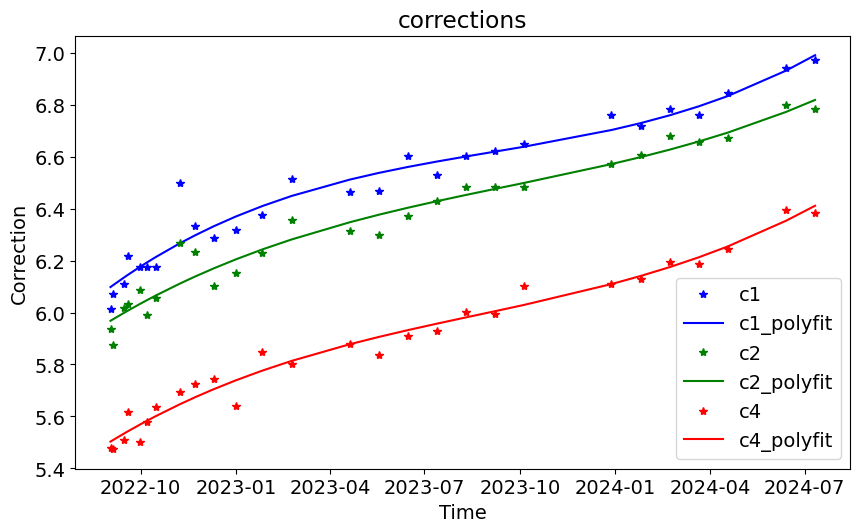

In [121]:

# Plotting
plt.rcParams.update({'font.size': 14, 'legend.fontsize': 14})
fig = plt.figure(figsize=(10, 6))
plt.plot(tm, c1, 'b*')  # Ensure tm is used for plotting against c1
plt.plot(tm, poly_fit, 'b-', label=f'Polynomial fit (degree {degree})')
plt.plot(tm, c2, 'g*')  # Ensure tm is used for plotting against c2
plt.plot(tm, c2poly_fit, 'g-', label=f'Polynomial fit (degree {degree})')
plt.plot(tm, c4, 'r*')  # Ensure tm is used for plotting against c4
plt.plot(tm, c4poly_fit, 'r-', label=f'Polynomial fit (degree {degree})')
#plt.plot(tm, c5, 'y*')  # Ensure tm is used for plotting against c5
#plt.plot(tm, c5poly_fit, 'y-', label=f'Polynomial fit (degree {degree})')
plt.title('corrections')
plt.xlabel('Time')
plt.ylabel('Correction')
#plt.ylim([5, 8])
plt.legend(['c1','c1_polyfit','c2','c2_polyfit','c4','c4_polyfit',])
plt.gca().set_aspect(250, adjustable='box')
fig.savefig('Corrections.png', format='png')

plt.show()

In [33]:
corr1 = np.polyval(coeffsc1, df_combined.time)
corr2 = np.polyval(coeffsc2, df_combined.time)
corr4 = np.polyval(coeffsc4, df_combined.time)

df_combined['newprs_pressure1'] = corr1 + df_combined.prs_pressure
df_combined['newprs_pressure2'] = corr2 + df_combined.prs_pressure
df_combined['newprs_pressure4'] = corr4 + df_combined.prs_pressure

df_combined['time'] = pd.to_datetime(df_combined['time'], unit='s')
#df_list.append(df_new)

# Combine all DataFrames in df_list into one
#df_combined = pd.concat(df_list, ignore_index=True)

In [35]:
df_combined

,time,temperature,pitch,roll,dqz_pressure,dqz_temperature,prs_pressure,prs_temperature,tmp_message_timestamp,inc_message_timestamp,dqz_message_timestamp,prs_message_timestamp,newprs_pressure1,newprs_pressure2,newprs_pressure4
0,2022-09-01 01:41:12,2.4497,0.8344,2.2438,NaN,2.8651,15522.3389,2.9314,1661996475,1661996482,1661996484,1661996492,15528.434776,15528.305247,15527.840064
1,2022-09-01 01:42:12,2.4494,0.8406,2.2469,NaN,2.8636,15522.2812,2.9309,1661996535,1661996542,1661996544,1661996552,15528.377078,15528.247549,15527.782366
2,2022-09-01 01:43:12,2.4497,0.8406,2.2625,NaN,2.8636,15522.2314,2.9290,1661996595,1661996602,1661996604,1661996612,15528.327280,15528.197750,15527.732567
3,2022-09-01 01:44:12,2.4499,0.8500,2.2438,NaN,2.8636,15522.1777,2.9289,1661996655,1661996662,1661996664,1661996672,15528.273582,15528.144052,15527.678869
4,2022-09-01 01:45:12,2.4507,0.8406,2.2406,NaN,2.8636,15522.0176,2.9270,1661996715,1661996722,1661996724,1661996732,15528.113484,15527.983954,15527.518771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2.4752,0.9281,2.2625,15526.7646,2.8942,15519.8564,NaN,1722459299,1722459306,1722459308,1722459316,15526.896549,15526.712302,15526.314576
866233,2024-07-31 20:55:56,2.4742,0.9250,2.2594,15526.7236,2.8942,15519.7832,NaN,1722459359,1722459366,1722459368,1722459376,15526.823350,15526.639103,15526.241378
866234,2024-07-31 20:56:56,2.4745,0.9250,2.2687,15526.6914,2.8938,15519.7656,NaN,1722459419,1722459426,1722459428,1722459436,15526.805752,15526.621504,15526.223779
866235,2024-07-31 20:57:56,2.4752,0.9313,2.2656,15526.6572,2.8939,15519.6592,NaN,1722459479,1722459486,1722459488,1722459496,15526.699354,15526.515105,15526.117381


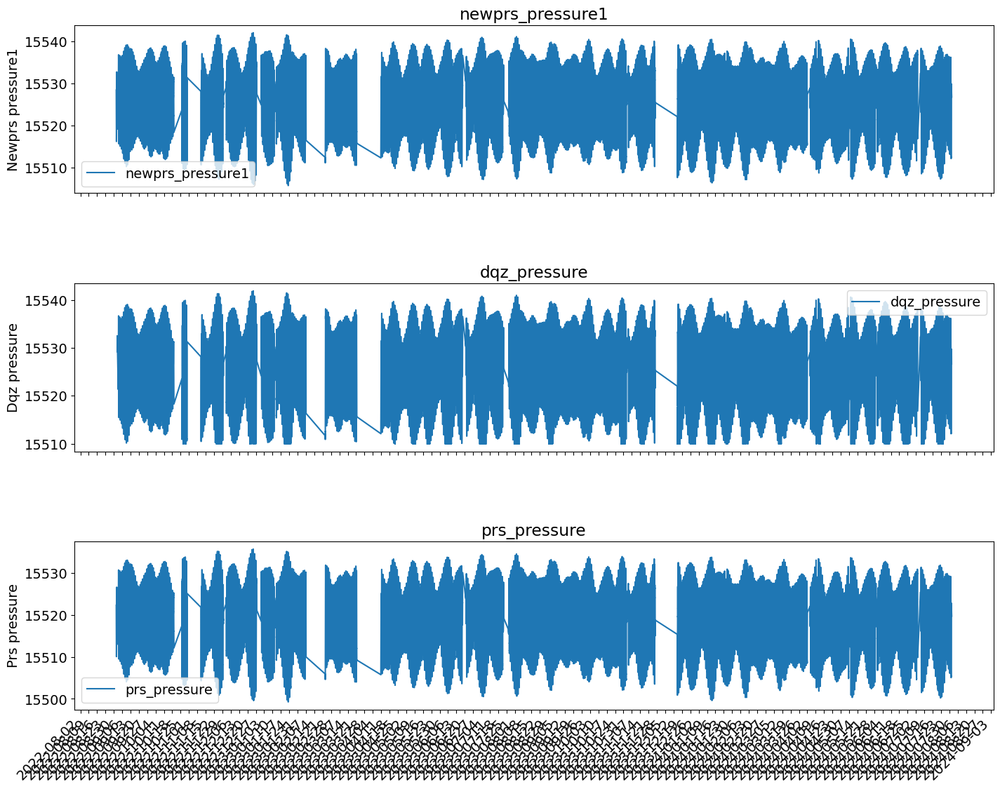

In [37]:
# Plot the combined data
fig, axs = plt.subplots(3, 1, figsize=(16, 13), sharex=True)  # Increase the figure size and share x-axis

# Plot each variable on its own subplot
variables = ['newprs_pressure1', 'dqz_pressure', 'prs_pressure']
for i, var in enumerate(variables):
    axs[i].plot(df_combined['time'], df_combined[var], linestyle='-', label=f'{var}')  # Use line plot
    axs[i].set_title(f'{var}')
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    axs[i].xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))  # Adjust tick frequency
    axs[i].set_ylabel(var.replace('_', ' ').capitalize())
    axs[i].legend()
    plt.setp(axs[i].xaxis.get_majorticklabels(), rotation=45, ha='right')

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

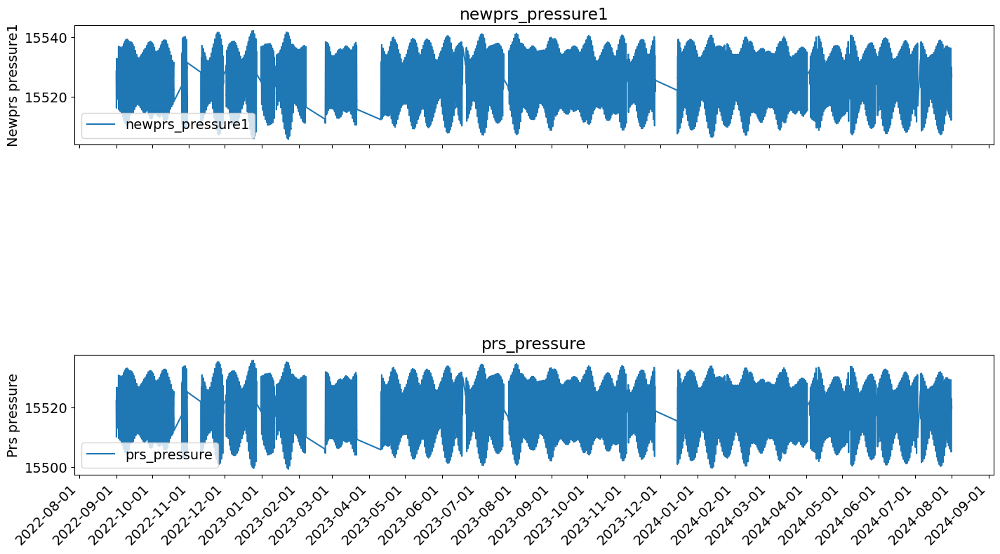

In [38]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Assuming df_combined is already defined and contains the necessary data

# Define the variables to plot, excluding 'dqz_pressure'
variables = ['newprs_pressure1', 'prs_pressure']

# Create subplots
fig, axs = plt.subplots(len(variables), 1, figsize=(16, 13), sharex=True)  # Adjust number of subplots

# Plot each variable on its own subplot
for i, var in enumerate(variables):
    axs[i].plot(df_combined['time'], df_combined[var], linestyle='-', label=f'{var}')  # Use line plot
    axs[i].set_title(f'{var}')
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    axs[i].xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust tick frequency to monthly
    axs[i].set_ylabel(var.replace('_', ' ').capitalize())
    axs[i].legend()
    plt.setp(axs[i].xaxis.get_majorticklabels(), rotation=45, ha='right')

    # Set aspect ratio (e.g., 1 means equal aspect ratio, adjust as needed)
    axs[i].set_aspect(aspect=2.5)

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()



In [39]:
df_combined

,time,temperature,pitch,roll,dqz_pressure,dqz_temperature,prs_pressure,prs_temperature,tmp_message_timestamp,inc_message_timestamp,dqz_message_timestamp,prs_message_timestamp,newprs_pressure1,newprs_pressure2,newprs_pressure4
0,2022-09-01 01:41:12,2.4497,0.8344,2.2438,NaN,2.8651,15522.3389,2.9314,1661996475,1661996482,1661996484,1661996492,15528.434776,15528.305247,15527.840064
1,2022-09-01 01:42:12,2.4494,0.8406,2.2469,NaN,2.8636,15522.2812,2.9309,1661996535,1661996542,1661996544,1661996552,15528.377078,15528.247549,15527.782366
2,2022-09-01 01:43:12,2.4497,0.8406,2.2625,NaN,2.8636,15522.2314,2.9290,1661996595,1661996602,1661996604,1661996612,15528.327280,15528.197750,15527.732567
3,2022-09-01 01:44:12,2.4499,0.8500,2.2438,NaN,2.8636,15522.1777,2.9289,1661996655,1661996662,1661996664,1661996672,15528.273582,15528.144052,15527.678869
4,2022-09-01 01:45:12,2.4507,0.8406,2.2406,NaN,2.8636,15522.0176,2.9270,1661996715,1661996722,1661996724,1661996732,15528.113484,15527.983954,15527.518771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2.4752,0.9281,2.2625,15526.7646,2.8942,15519.8564,NaN,1722459299,1722459306,1722459308,1722459316,15526.896549,15526.712302,15526.314576
866233,2024-07-31 20:55:56,2.4742,0.9250,2.2594,15526.7236,2.8942,15519.7832,NaN,1722459359,1722459366,1722459368,1722459376,15526.823350,15526.639103,15526.241378
866234,2024-07-31 20:56:56,2.4745,0.9250,2.2687,15526.6914,2.8938,15519.7656,NaN,1722459419,1722459426,1722459428,1722459436,15526.805752,15526.621504,15526.223779
866235,2024-07-31 20:57:56,2.4752,0.9313,2.2656,15526.6572,2.8939,15519.6592,NaN,1722459479,1722459486,1722459488,1722459496,15526.699354,15526.515105,15526.117381


In [40]:
import pandas as pd
import numpy as np
from scipy.optimize import least_squares

def parse_to_dataframe(data):
    lines = data.split('\n')
    parsed_data = [line.split() for line in lines if line]
    df = pd.DataFrame(parsed_data, columns=['Year', 'Month', 'Day', 'Hour', 'Minute', 'Second', 'Value'])
    df['DateTime'] = pd.to_datetime(df[['Year', 'Month', 'Day', 'Hour', 'Minute', 'Second']])
    df['Value'] = pd.to_numeric(df['Value'])
    df.drop(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Second'], axis=1, inplace=True)
    return df

# Reading the contents of the files
with open('pred_F_2022.txt', 'r') as file_2022, open('pred_F_2023.txt', 'r') as file_2023, open('pred_F_2024.txt', 'r') as file_2024:
    data_2022 = file_2022.read()
    data_2023 = file_2023.read()
    data_2024 = file_2024.read()

df_2022 = parse_to_dataframe(data_2022)
df_2023 = parse_to_dataframe(data_2023)
df_2024 = parse_to_dataframe(data_2024)

tidal_df = pd.concat([df_2022, df_2023,df_2024], ignore_index=True)
tidal_df.set_index('DateTime', inplace=True)


In [41]:
df_combined = df_combined.reset_index()
combined_df4 = pd.DataFrame({
    'Record Time': df_combined['time'].values,
    'Pressure (kPa)':df_combined['newprs_pressure1'].values,
    'DateTime':df_combined['time'].values,
    'PressureRaw (kPa)':df_combined['prs_pressure'].values
})
combined_df4['DateTime'] = pd.to_datetime(combined_df4['Record Time'])
combined_df4.set_index('DateTime', inplace=True)

pressure_df = pd.DataFrame({
    'Record Time': df_combined['time'],
    'Pressure (kPa)':df_combined['newprs_pressure1']
}).set_index('Record Time')
pressure_df
df_combined.set_index('time', inplace=True)

In [42]:
df_combined['newprs_pressure1']

time
2022-09-01 01:41:12    15528.434776
2022-09-01 01:42:12    15528.377078
2022-09-01 01:43:12    15528.327280
2022-09-01 01:44:12    15528.273582
2022-09-01 01:45:12    15528.113484
                           ...     
2024-07-31 20:54:56    15526.896549
2024-07-31 20:55:56    15526.823350
2024-07-31 20:56:56    15526.805752
2024-07-31 20:57:56    15526.699354
2024-07-31 20:58:56    15526.729655
Name: newprs_pressure1, Length: 866237, dtype: float64

In [44]:
# Optimization function
def optimize_tidal_influence(params, tidal_df, pressure_df):
    amplitude, rho = params
    adjusted_tidal = amplitude * tidal_df['Value']
    tidal_df['Adjusted Value'] = adjusted_tidal
    interpolated_tidal = tidal_df.reindex(pressure_df.index, method='nearest')['Adjusted Value']
    corrected_pressure = pressure_df['Pressure (kPa)'] - (rho * 9.81 * interpolated_tidal) * 0.001
    return np.var(corrected_pressure)

# Initial guesses for amplitude, phase, and rho
initial_amplitude = 1  # Adjust based on your data
initial_phase = 0      # Adjust based on your data
initial_rho = 1025     # Initial guess for the density of seawater (kg/m^3)

# Perform optimization
result = least_squares(optimize_tidal_influence, x0=[initial_amplitude, initial_rho],
                       args=(tidal_df, combined_df4))

optimized_amplitude, optimized_rho = result.x

# Apply optimized parameters
tidal_df['Adjusted Value'] = optimized_amplitude * tidal_df['Value']
combined_df4['Tidal Influence (kPa)'] = (optimized_rho * 9.81 * tidal_df.reindex(combined_df4.index, method='nearest')['Adjusted Value']) * 0.001
combined_df4['Corrected Pressure (kPa)'] = combined_df4['Pressure (kPa)'] - combined_df4['Tidal Influence (kPa)']
combined_df4['Detided PressureRaw (kPa)'] = combined_df4['PressureRaw (kPa)'] - combined_df4['Tidal Influence (kPa)']

# Proceed with any further analysis or steps as needed
# Reset the index to make 'Record Time' a column again
combined_df4.reset_index(inplace=True)

del tidal_df
combined_df4

,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa)
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993
...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297


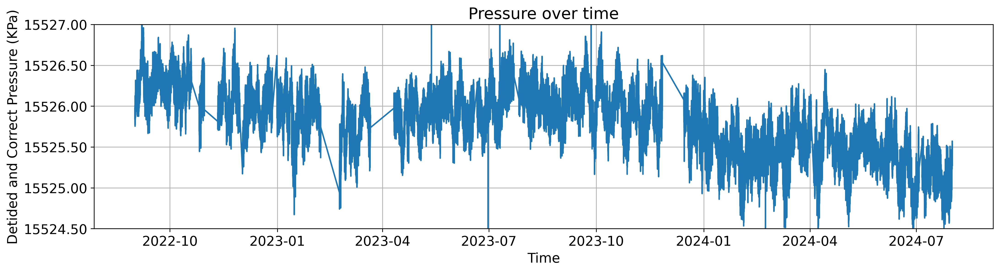

In [45]:
# Plot the combined data
import matplotlib.ticker as ticker

combined_df4 = combined_df4.sort_values(by='DateTime')
fig, axs = plt.subplots(1, 1, figsize=(16, 13), sharex=True, dpi=300)  # Increase the figure size and share x-axis

# Plot each variable on its own subplot
var = ['Corrected Pressure (kPa)']
plt.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4[var], linestyle='-', label=f'{var}')  # Use line plot

# Automatically adjust subplot parameters to give specified padding
plt.xlabel('Time')
plt.ylabel('Detided and Correct Pressure (KPa)')
plt.title('Pressure over time')
plt.tight_layout(pad=5.0)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
plt.ylim([15524.5,15527])

plt.grid(True)
plt.gca().set_aspect(70)
# Show the plot
fig.savefig('CorrectedPressure.png', format='png')
plt.show()

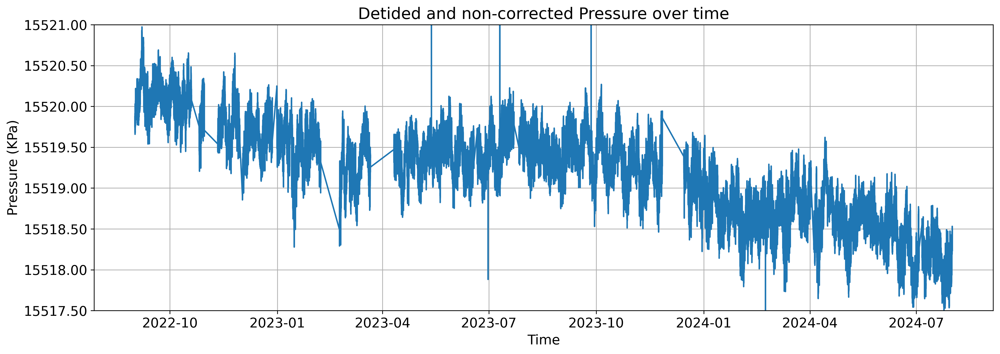

In [47]:
# Plot the combined data
combined_df4 = combined_df4.sort_values(by='DateTime')
fig, axs = plt.subplots(1, 1, figsize=(16, 13), sharex=True, dpi=300)  # Increase the figure size and share x-axis

# Plot each variable on its own subplot
var = ['Detided PressureRaw (kPa)']
plt.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4[var], linestyle='-', label=f'{var}')  # Use line plot

# Automatically adjust subplot parameters to give specified padding
plt.xlabel('Time')
plt.ylabel('Pressure (KPa)')
plt.title('Detided and non-corrected Pressure over time')
plt.tight_layout(pad=5.0)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
plt.ylim([15517.5,15521])
plt.grid(True)
plt.gca().set_aspect(70)
# Show the plot
fig.savefig('CorrectedPressure.png', format='png')
plt.show()

In [48]:
# calculate mean of MJ seafloor uplfit
mean_valueCorrected = combined_df4['Corrected Pressure (kPa)'].mean()

# calculate mean of AZA seafloor uplfit
mean_valueRaw = combined_df4['Detided PressureRaw (kPa)'].mean()


# calculate difference between the mean of each 

PressureMeanDiff = mean_valueCorrected - mean_valueRaw
print(PressureMeanDiff)

# Add difference to aza data

combined_df4['ScaledRawPressure'] = combined_df4['Detided PressureRaw (kPa)'] + PressureMeanDiff

combined_df4



6.607984901243981


,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa),ScaledRawPressure
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493,15526.375478
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213,15526.399197
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862,15526.431847
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612,15526.460597
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993,15526.383978
...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986,15525.036971
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613,15524.991598
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870,15525.002855
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297,15524.924282


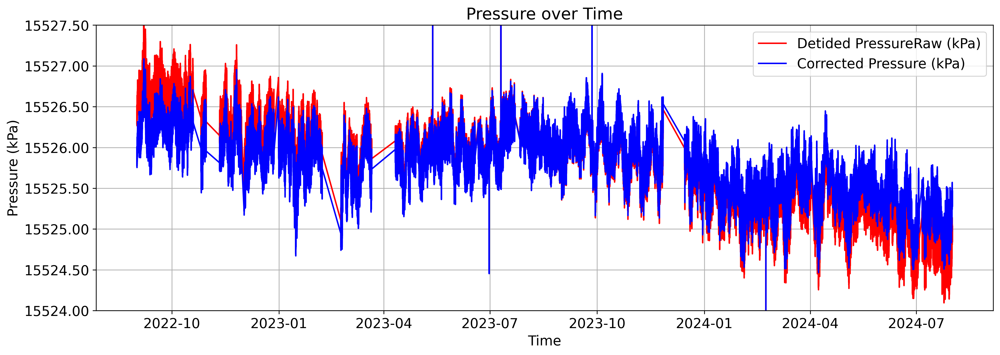

In [125]:
import pandas as pd
import matplotlib.pyplot as plt

# Plot the combined data
combined_df4 = combined_df4.sort_values(by='DateTime')
fig, axs = plt.subplots(1, 1, figsize=(16, 13), dpi=300)  # Increase the figure size and use one subplot

# Plot Detided PressureRaw (kPa)
axs.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4['ScaledRawPressure'], linestyle='-', label='Detided PressureRaw (kPa)', color='red')

# Plot Corrected Pressure (kPa)
axs.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4['Corrected Pressure (kPa)'], linestyle='-', label='Corrected Pressure (kPa)', color='blue')


# Automatically adjust subplot parameters to give specified padding
axs.set_xlabel('Time')
axs.set_ylabel('Pressure (kPa)')
axs.set_title('Pressure over Time')
axs.set_ylim([15524, 15527.5])

plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

axs.grid(True)
axs.set_aspect(70)
axs.legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Save the plot
fig.savefig('CorrectedVSRawPressure.png', format='png')

# Show the plot
plt.show()


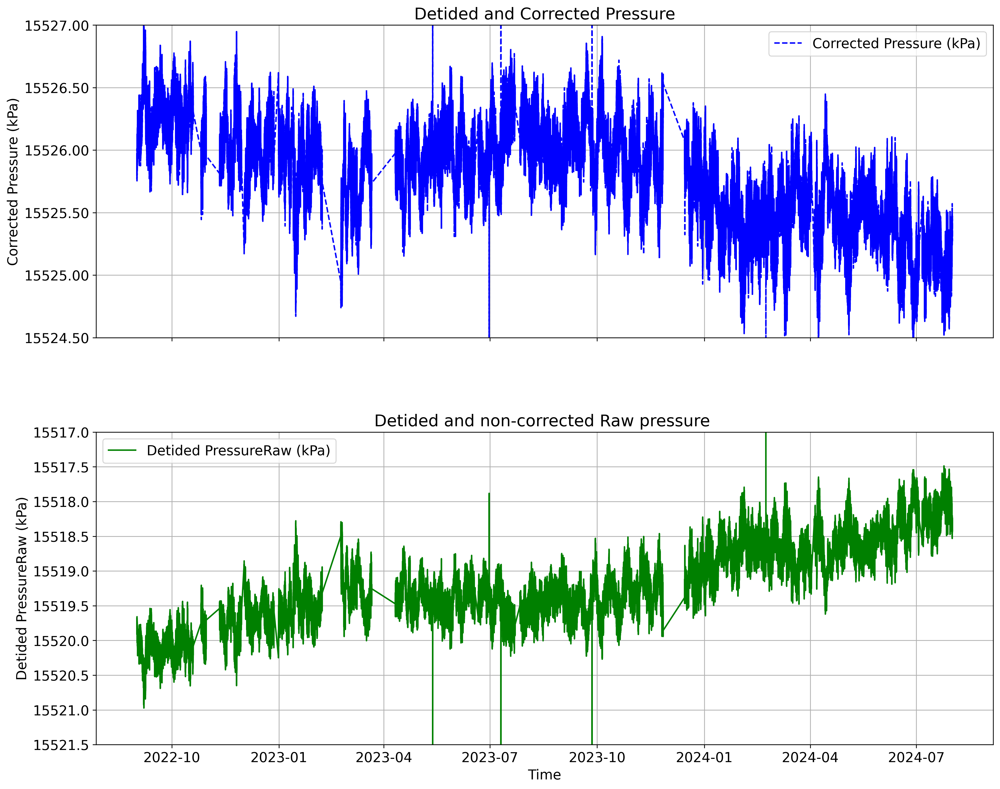

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Sort the data by DateTime
combined_df4 = combined_df4.sort_values(by='DateTime')

# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(16, 13), dpi=300, sharex=True)  # Two rows, one column

# Plot Corrected Pressure (kPa) in the first subplot
axs[0].plot(pd.to_datetime(combined_df4['DateTime']), combined_df4['Corrected Pressure (kPa)'], linestyle='--', label='Corrected Pressure (kPa)', color='blue')
axs[0].set_ylabel('Corrected Pressure (kPa)')
axs[0].set_title('Detided and Corrected Pressure')
axs[0].yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
axs[0].set_ylim([15524.5, 15527])

axs[0].grid(True)
axs[0].legend()

# Plot Detided PressureRaw (kPa) in the second subplot
axs[1].plot(pd.to_datetime(combined_df4['DateTime']), combined_df4['Detided PressureRaw (kPa)'], linestyle='-', label='Detided PressureRaw (kPa)', color='green')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Detided PressureRaw (kPa)')
axs[1].set_title('Detided and non-corrected Raw pressure ')
axs[1].set_ylim([15521.5, 15517])

axs[1].grid(True)
axs[1].legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Save the figure
#fig.savefig('Pressure_Comparison.png', format='png')

# Show the plot
plt.show()


In [53]:
import pandas as pd

def calculate_vertical_uplift(pressure_change_kPa, water_density=1025, gravity=9.8):
    """
    Calculate vertical uplift from seafloor pressure data.

    Parameters:
    pressure_change_kPa (float): Pressure change in kPa.
    water_density (float): Density of seawater in kg/m^3. Default is 1025 kg/m^3.
    gravity (float): Acceleration due to gravity in m/s^2. Default is 9.8 m/s^2.

    Returns:
    float: Vertical uplift in meters.
    """
    # Convert kPa to Pa
    pressure_change_Pa = pressure_change_kPa * 1000
    
    # Calculate depth change (vertical uplift) in meters
    vertical_uplift = pressure_change_Pa / (water_density * gravity)
    
    return vertical_uplift


# Apply the vertical uplift calculation to each row
combined_df4['vertical_uplift_m'] = combined_df4['Corrected Pressure (kPa)'].apply(calculate_vertical_uplift)




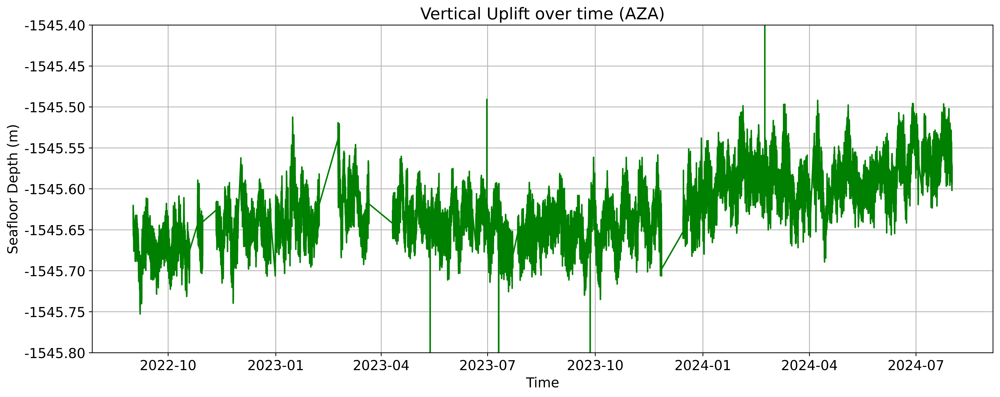

In [54]:
# Plot the combined data

fig, axs = plt.subplots(1, 1, figsize=(16, 13), sharex=True, dpi = 500)  # Increase the figure size and share x-axis

# Plot each variable on its own subplot
var = ['vertical_uplift_m']
plt.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4[var]*-1, linestyle='-', color ='green', label=f'{var}')  # Use line plot

# Automatically adjust subplot parameters to give specified padding
plt.xlabel('Time')
plt.ylabel('Seafloor Depth (m)')
plt.title('Vertical Uplift over time (AZA)')
plt.tight_layout(pad=5.0)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

plt.ylim([-1545.8,-1545.4])
plt.grid(True)
plt.gca().set_aspect(700)

# Show the plot
fig.savefig('SeafloorDepth.png', format='png')
plt.show() 


In [55]:
combined_df4

,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa),ScaledRawPressure,vertical_uplift_m
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493,15526.375478,1545.630997
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213,15526.399197,1545.633359
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862,15526.431847,1545.636610
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612,15526.460597,1545.639472
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993,15526.383978,1545.631844
...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986,15525.036971,1545.591751
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613,15524.991598,1545.587234
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870,15525.002855,1545.588355
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297,15524.924282,1545.580533


In [56]:
import pandas as pd

def calculate_vertical_uplift(pressure_change_kPa, water_density=1025, gravity=9.8):
    """
    Calculate vertical uplift from seafloor pressure data.

    Parameters:
    pressure_change_kPa (float): Pressure change in kPa.
    water_density (float): Density of seawater in kg/m^3. Default is 1025 kg/m^3.
    gravity (float): Acceleration due to gravity in m/s^2. Default is 9.8 m/s^2.

    Returns:
    float: Vertical uplift in meters.
    """
    # Convert kPa to Pa
    pressure_change_Pa = pressure_change_kPa * 1000
    
    # Calculate depth change (vertical uplift) in meters
    vertical_uplift = pressure_change_Pa / (water_density * gravity)
    
    return vertical_uplift


# Apply the vertical uplift calculation to each row
combined_df4['vertical_upliftRaw_m'] = combined_df4['Detided PressureRaw (kPa)'].apply(calculate_vertical_uplift)
combined_df4

,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa),ScaledRawPressure,vertical_uplift_m,vertical_upliftRaw_m
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493,15526.375478,1545.630997,1545.024141
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213,15526.399197,1545.633359,1545.026502
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862,15526.431847,1545.636610,1545.029752
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612,15526.460597,1545.639472,1545.032614
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993,15526.383978,1545.631844,1545.024987
...,...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986,15525.036971,1545.591751,1544.890890
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613,15524.991598,1545.587234,1544.886373
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870,15525.002855,1545.588355,1544.887493
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297,15524.924282,1545.580533,1544.879671


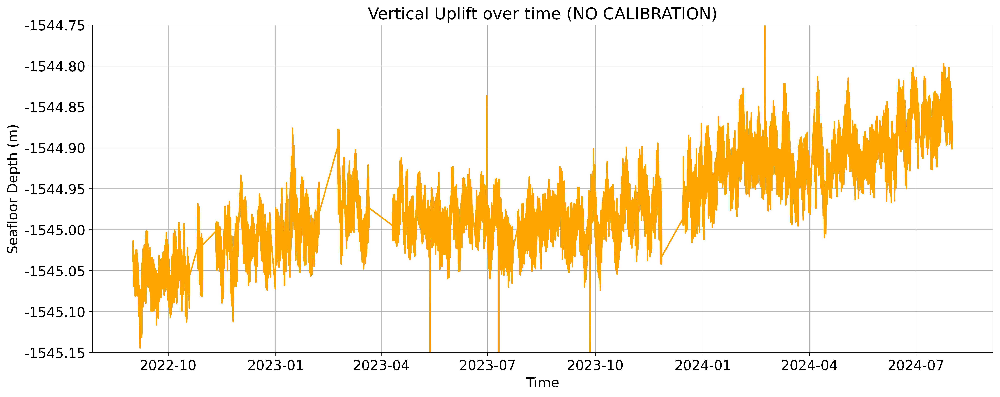

In [57]:
# Plot the combined data

fig, axs = plt.subplots(1, 1, figsize=(16, 13), sharex=True, dpi = 500)  # Increase the figure size and share x-axis

# Plot each variable on its own subplot
var = ['vertical_upliftRaw_m']
plt.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4[var]*-1, linestyle='-', color ='orange', label=f'{var}')  # Use line plot

# Automatically adjust subplot parameters to give specified padding
plt.xlabel('Time')
plt.ylabel('Seafloor Depth (m)')
plt.title('Vertical Uplift over time (NO CALIBRATION)')
plt.tight_layout(pad=5.0)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

plt.ylim([-1545.15,-1544.75])
plt.grid(True)
plt.gca().set_aspect(700)

# Show the plot
fig.savefig('SeafloorDepth.png', format='png')
plt.show() 


In [58]:
#-------------------------------------------------------- Plotting MJ03 --------------------------------------------------------------------

In [59]:
import pandas as pd

# Define column names
column_names = ['Datetime', 'Depth', 'Pressure', 'Temperature']

# Read the .data file
df = pd.read_csv('MJ03FAllNANO.data', delimiter=',', names=column_names, parse_dates=['Datetime'])

# Convert 'Timestamp' column to datetime (in case it's not automatically recognized)
df['Datetime'] = pd.to_datetime(df['Datetime'], format='%Y/%m/%d %H:%M:%S')

# Optionally, set 'Timestamp' as the index
df.set_index('Datetime', inplace=True)

# Display data frame
df


,Depth,Pressure,Temperature
Datetime,,,
2022-01-01 00:00:00,2251.6316,1510.1345,2.716402
2022-01-01 00:00:15,2251.6320,1510.1358,2.716386
2022-01-01 00:00:30,2251.6293,1510.1350,2.716387
2022-01-01 00:00:45,2251.6220,1510.1311,2.716394
2022-01-01 00:01:00,2251.6219,1510.1321,2.716377
...,...,...,...
2024-08-04 23:57:00,2253.8803,1509.9476,2.774899
2024-08-04 23:57:15,2253.8776,1509.9472,2.774902
2024-08-04 23:57:30,2253.8756,1509.9472,2.774920


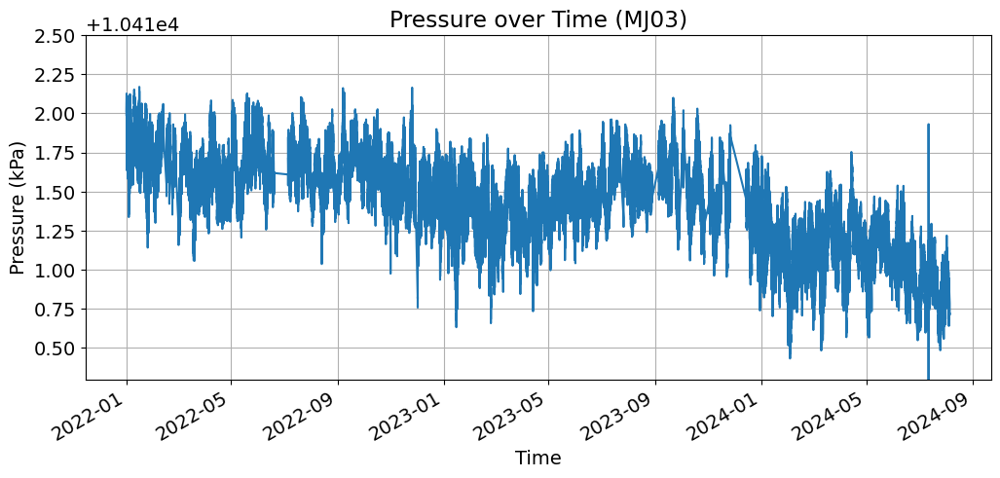

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert Pressure from psi to kPa
df['Pressure_kPa'] = df['Pressure'] * 6.89476


# Plot Pressure in kPa over Time
plt.figure(figsize=(12, 6))
df['Pressure_kPa'].plot()
plt.title('Pressure over Time (MJ03)')
plt.xlabel('Time')
plt.ylabel('Pressure (kPa)')
plt.ylim([10410.3,10412.5])
plt.gca().set_aspect(180)
plt.grid(True)
plt.show()


In [61]:
import pandas as pd

def calculate_vertical_uplift(Pressure_kPa, water_density=1025, gravity=9.8):
    """
    Calculate vertical uplift from seafloor pressure data.

    Parameters:
    pressure_change_kPa (float): Pressure change in kPa.
    water_density (float): Density of seawater in kg/m^3. Default is 1025 kg/m^3.
    gravity (float): Acceleration due to gravity in m/s^2. Default is 9.8 m/s^2.

    Returns:
    float: Vertical uplift in meters.
    """
    # Convert kPa to Pa
    pressure_Pa = Pressure_kPa * 1000
    
    # Calculate depth change (vertical uplift) in meters
    vertical_uplift = pressure_Pa / (water_density * gravity) 
    
    return vertical_uplift


# Apply the vertical uplift calculation to each row
df['vertical_uplift_m'] = df['Pressure_kPa'].apply(calculate_vertical_uplift)




In [62]:
df

,Depth,Pressure,Temperature,Pressure_kPa,vertical_uplift_m
Datetime,,,,,
2022-01-01 00:00:00,2251.6316,1510.1345,2.716402,10412.014945,1036.537078
2022-01-01 00:00:15,2251.6320,1510.1358,2.716386,10412.023908,1036.537970
2022-01-01 00:00:30,2251.6293,1510.1350,2.716387,10412.018393,1036.537421
2022-01-01 00:00:45,2251.6220,1510.1311,2.716394,10411.991503,1036.534744
2022-01-01 00:01:00,2251.6219,1510.1321,2.716377,10411.998398,1036.535430
...,...,...,...,...,...
2024-08-04 23:57:00,2253.8803,1509.9476,2.774899,10410.726315,1036.408792
2024-08-04 23:57:15,2253.8776,1509.9472,2.774902,10410.723557,1036.408517
2024-08-04 23:57:30,2253.8756,1509.9472,2.774920,10410.723557,1036.408517


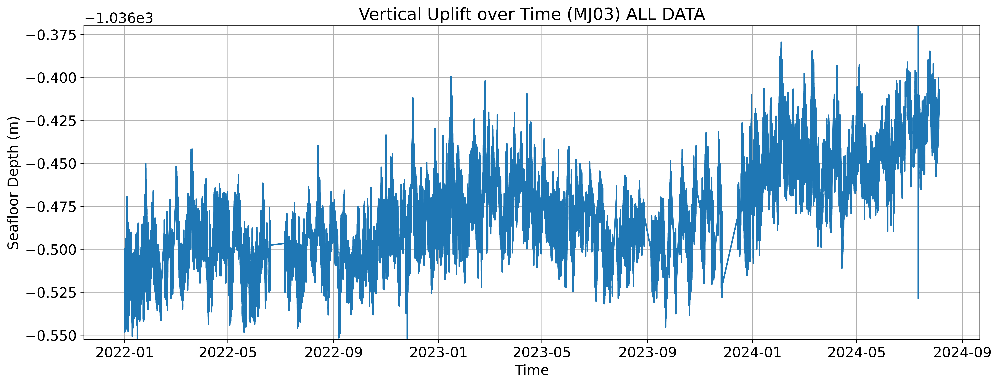

In [64]:
import matplotlib.pyplot as plt

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot vertical uplift over time, inverted
ax.plot(df.index, df['vertical_uplift_m'] * -1, linestyle='-')  # Use the index as the x-axis

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (MJ03) ALL DATA')

# Adjust the y-axis limits to match the reference plot

# Set grid and aspect ratio to match the reference plot
ax.grid(True)
ax.set_ylim([-1036.5524527470384,-1036.37])

ax.set_aspect(2000)  # Set the aspect ratio to match the reference plot

# Automatically adjust subplot parameters to give specified padding
#plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

# Optionally save the plot
# fig.savefig('SeafloorDepth.png', format='png')


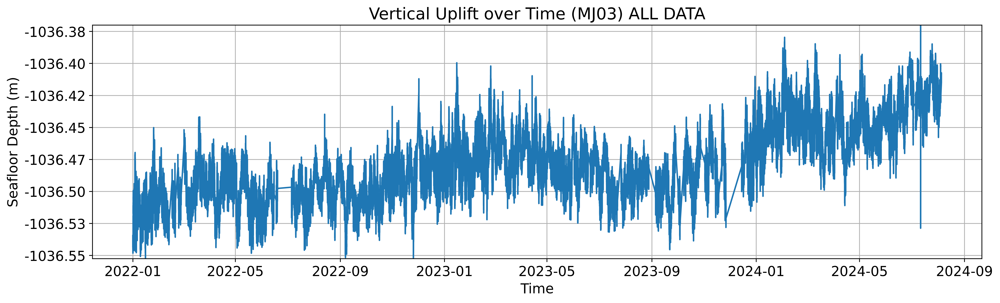

In [65]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot vertical uplift over time, inverted
ax.plot(df.index, df['vertical_uplift_m'] * -1, linestyle='-')  # Use the index as the x-axis

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (MJ03) ALL DATA')

# Adjust the y-axis limits
ax.set_ylim([-1036.5524527470384, -1036.37])

# Set grid and aspect ratio to match the reference plot
ax.grid(True)
ax.set_aspect(1500)  # Set the aspect ratio to match the reference plot

# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

# Optionally save the plot
# fig.savefig('SeafloorDepth.png', format='png')


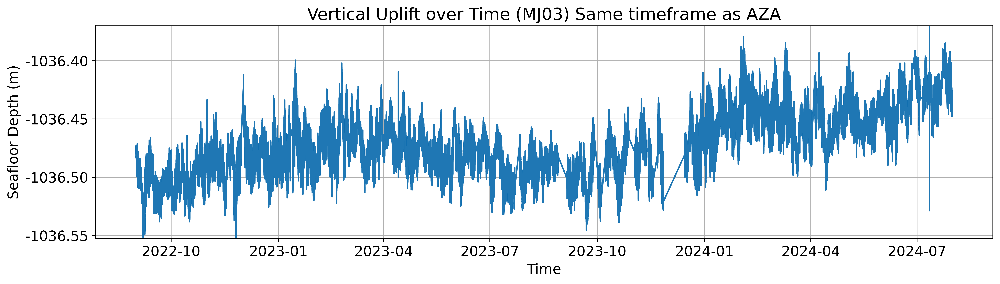

In [66]:
import matplotlib.pyplot as plt

# Define the date range for filtering
start_date = '2022-09-01'
end_date = '2024-07-31'

# Convert date strings to datetime objects
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter the DataFrame based on the date range
filtered_df = df.loc[start_date:end_date]

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot vertical uplift over time, inverted
ax.plot(filtered_df.index, filtered_df['vertical_uplift_m'] * -1, linestyle='-')  # Use the index as the x-axis

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (MJ03) Same timeframe as AZA')

# Adjust the y-axis limits to match the reference plot
ax.set_ylim([-1036.5524527470384, -1036.37])

# Set grid and aspect ratio to match the reference plot
ax.grid(True)
ax.set_aspect(1000)  # Set the aspect ratio to match the reference plot
# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

# Automatically adjust subplot parameters to give specified padding
# plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

# Optionally save the plot
# fig.savefig('SeafloorDepth.png', format='png')


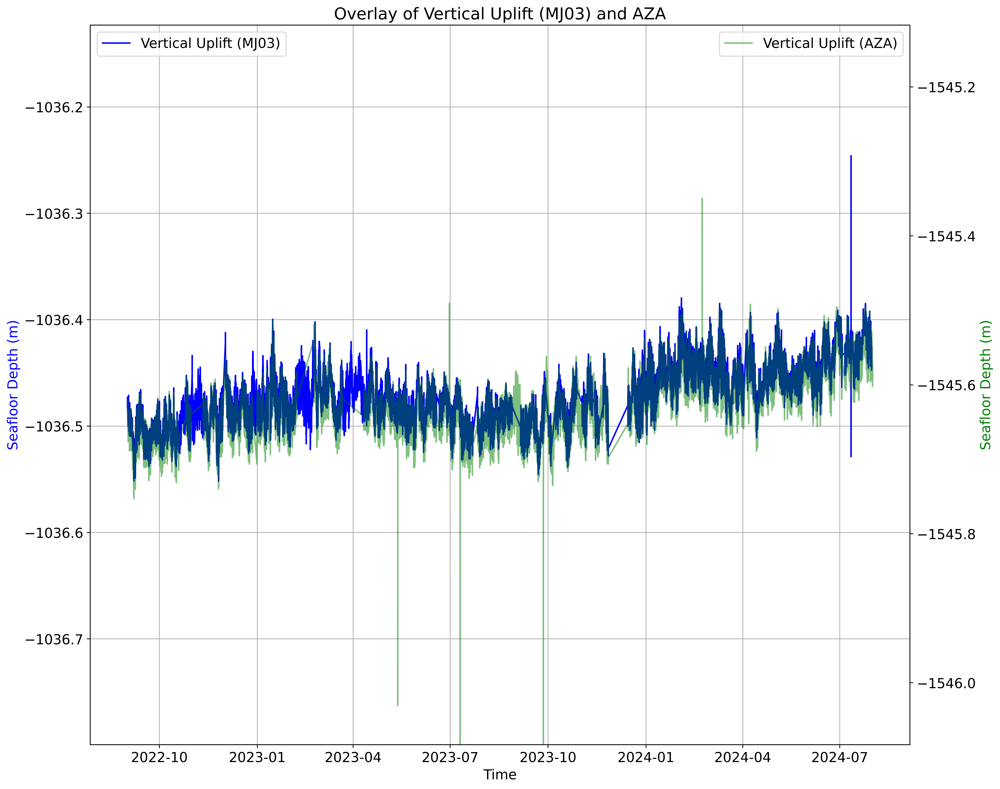

In [67]:
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

# Define the date range for filtering
start_date = '2022-09-01'
end_date = '2024-07-31'

# Convert date strings to datetime objects
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter the DataFrame based on the date range
filtered_df = df.loc[start_date:end_date]

# Create a figure and axis for the plot
fig, ax1 = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot the first dataset: Vertical uplift over time
ax1.plot(filtered_df.index, filtered_df['vertical_uplift_m'] * -1, linestyle='-', color='b', label='Vertical Uplift (MJ03)')
ax1.set_xlabel('Time')
ax1.set_ylabel('Seafloor Depth (m)', color='b')
ax1.set_title('Overlay of Vertical Uplift (MJ03) and AZA')

# Set y-axis limits for the first plot
ax1.set_ylim([-1036.5524527470384, -1036.37])
ax1.grid(True)
ax1.set_aspect(1000)

# Set y-axis formatter to plain (non-scientific notation)
ax1.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax1.ticklabel_format(style='plain', axis='y')

# Create a second y-axis to overlay the second plot
ax2 = ax1.twinx()
ax2.plot(pd.to_datetime(combined_df4['DateTime']), combined_df4['vertical_uplift_m'] * -1, linestyle='-', color='g', label='Vertical Uplift (AZA)', alpha=0.5)

# Set y-axis limits for the second plot
ax2.set_ylim([-1545.8, -1545.4])
ax2.set_aspect(700)

# Set y-axis formatter to plain (non-scientific notation)
ax2.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax2.ticklabel_format(style='plain', axis='y')

# Label for the second y-axis
ax2.set_ylabel('Seafloor Depth (m)', color='g')

# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

# Optionally save the plot
# fig.savefig('Overlay_SeafloorDepth.png', format='png')


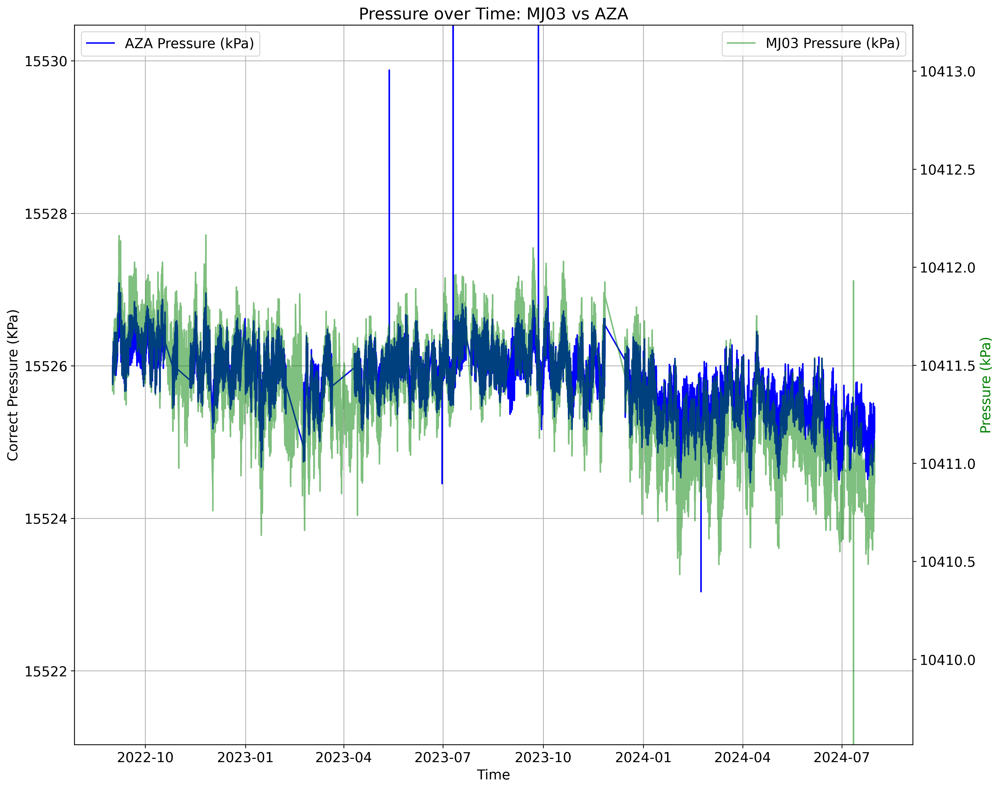

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the date range for filtering
start_date = '2022-09-01'
end_date = '2024-07-31'

# Convert date strings to datetime objects
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter the DataFrames based on the date range
filtered_combined_df4 = combined_df4[(combined_df4['DateTime'] >= start_date) & (combined_df4['DateTime'] <= end_date)]

# Convert Pressure from psi to kPa for df
df['Pressure_kPa'] = df['Pressure'] * 6.89476

# Filter df based on the same date range
filtered_df = df.loc[start_date:end_date]

# Create a figure and axis for the plot
fig, ax1 = plt.subplots(figsize=(16, 13), dpi=300)  # Increase the figure size

# Plot the first dataset: Corrected Pressure (kPa) over time (combined_df4)
ax1.plot(pd.to_datetime(filtered_combined_df4['DateTime']), filtered_combined_df4['Corrected Pressure (kPa)'], linestyle='-', color='blue', label='AZA Pressure (kPa)')
ax1.set_xlabel('Time')
ax1.set_ylabel('Correct Pressure (KPa)')
ax1.set_title('Pressure over Time: MJ03 vs AZA')

# Set y-axis limits for the first plot
ax1.set_ylim([15524.5, 15527])
ax1.grid(True)
ax1.set_aspect(70)

# Set y-axis formatter to plain (non-scientific notation)
ax1.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax1.ticklabel_format(style='plain', axis='y')

# Create a second y-axis to overlay the second plot (MJ03 Pressure)
ax2 = ax1.twinx()
ax2.plot(filtered_df.index, filtered_df['Pressure_kPa'], linestyle='-', color='g', label='MJ03 Pressure (kPa)', alpha=0.5)

# Set y-axis limits for the second plot
ax2.set_ylim([10410.3, 10412.5])
ax2.set_aspect(180)

# Set y-axis formatter to plain (non-scientific notation)
ax2.yaxis.set_major_formatter(ScalarFormatter(useOffset=False))
ax2.ticklabel_format(style='plain', axis='y')

# Label for the second y-axis
ax2.set_ylabel('Pressure (kPa)', color='g')

# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()

# Optionally save the plot
# fig.savefig('Overlay_Pressure.png', format='png')


In [71]:
#get the mean of both, then get the difference, then add that to the MJ 

In [133]:
# calculate mean of MJ seafloor uplfit
mean_valueMJ = df['vertical_uplift_m'].mean()
std_valueMJ = df['vertical_uplift_m'].std()

# calculate mean of AZA seafloor uplfit
mean_valueAZA = combined_df4['vertical_uplift_m'].mean()
std_valueAZA = combined_df4['vertical_uplift_m'].std()
print(std_valueAZA)
print(std_valueMJ)

# Convert to negative
mean_valueMJ = mean_valueMJ * -1 
mean_valueAZA = mean_valueAZA * -1
print(mean_valueMJ)
print(mean_valueAZA)
# calculate difference between the mean of each 

SeafloorMeanDiff = mean_valueMJ - mean_valueAZA
print(SeafloorMeanDiff)

# Add difference to aza data

df['Diff_MJ_Uplift'] = df['vertical_uplift_m'] + SeafloorMeanDiff +0.01

df



0.039763150220763877
0.02813743176843362
-1036.4796077831284
-1545.6243892211794
509.14478143805104


,Depth,Pressure,Temperature,Pressure_kPa,vertical_uplift_m,Diff_MJ_Uplift
Datetime,,,,,,
2022-01-01 00:00:00,2251.6316,1510.1345,2.716402,10412.014945,1036.537078,1545.691859
2022-01-01 00:00:15,2251.6320,1510.1358,2.716386,10412.023908,1036.537970,1545.692751
2022-01-01 00:00:30,2251.6293,1510.1350,2.716387,10412.018393,1036.537421,1545.692202
2022-01-01 00:00:45,2251.6220,1510.1311,2.716394,10411.991503,1036.534744,1545.689525
2022-01-01 00:01:00,2251.6219,1510.1321,2.716377,10411.998398,1036.535430,1545.690212
...,...,...,...,...,...,...
2024-08-04 23:57:00,2253.8803,1509.9476,2.774899,10410.726315,1036.408792,1545.563573
2024-08-04 23:57:15,2253.8776,1509.9472,2.774902,10410.723557,1036.408517,1545.563299
2024-08-04 23:57:30,2253.8756,1509.9472,2.774920,10410.723557,1036.408517,1545.563299


In [135]:
combined_df4

,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa),ScaledRawPressure,vertical_uplift_m,vertical_upliftRaw_m,Scaled_Vertical_Raw_M
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493,15526.375478,1545.630997,1545.024141,1545.681979
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213,15526.399197,1545.633359,1545.026502,1545.684340
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862,15526.431847,1545.636610,1545.029752,1545.687591
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612,15526.460597,1545.639472,1545.032614,1545.690453
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993,15526.383978,1545.631844,1545.024987,1545.682825
...,...,...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986,15525.036971,1545.591751,1544.890890,1545.548728
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613,15524.991598,1545.587234,1544.886373,1545.544211
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870,15525.002855,1545.588355,1544.887493,1545.545332
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297,15524.924282,1545.580533,1544.879671,1545.537509


In [137]:
# calculate mean of Raw seafloor uplfit
mean_rawvalue = combined_df4['vertical_upliftRaw_m'].mean()

# calculate mean of AZA seafloor uplfit
#mean_valueAZA = combined_df4['vertical_uplift_m'].mean()

# Convert to negative
mean_rawvalue = mean_rawvalue * -1 
#mean_valueAZA = mean_valueAZA * -1
print(mean_rawvalue)
print(mean_valueAZA)
# calculate difference between the mean of each 

SeafloorAZADiff = mean_rawvalue - mean_valueAZA
print(SeafloorAZADiff)

# Add difference to aza data

combined_df4['Scaled_Vertical_Raw_M'] = combined_df4['vertical_upliftRaw_m'] + SeafloorAZADiff

combined_df4



-1544.9665510030377
-1545.6243892211794
0.6578382181417055


,DateTime,Record Time,Pressure (kPa),PressureRaw (kPa),Tidal Influence (kPa),Corrected Pressure (kPa),Detided PressureRaw (kPa),ScaledRawPressure,vertical_uplift_m,vertical_upliftRaw_m,Scaled_Vertical_Raw_M
0,2022-09-01 01:41:12,2022-09-01 01:41:12,15528.434776,15522.3389,2.571407,15525.863369,15519.767493,15526.375478,1545.630997,1545.024141,1545.681979
1,2022-09-01 01:42:12,2022-09-01 01:42:12,15528.377078,15522.2812,2.489987,15525.887091,15519.791213,15526.399197,1545.633359,1545.026502,1545.684340
2,2022-09-01 01:43:12,2022-09-01 01:43:12,15528.327280,15522.2314,2.407538,15525.919743,15519.823862,15526.431847,1545.636610,1545.029752,1545.687591
3,2022-09-01 01:44:12,2022-09-01 01:44:12,15528.273582,15522.1777,2.325088,15525.948495,15519.852612,15526.460597,1545.639472,1545.032614,1545.690453
4,2022-09-01 01:45:12,2022-09-01 01:45:12,15528.113484,15522.0176,2.241607,15525.871877,15519.775993,15526.383978,1545.631844,1545.024987,1545.682825
...,...,...,...,...,...,...,...,...,...,...,...
866232,2024-07-31 20:54:56,2024-07-31 20:54:56,15526.896549,15519.8564,1.427414,15525.469134,15518.428986,15525.036971,1545.591751,1544.890890,1545.548728
866233,2024-07-31 20:55:56,2024-07-31 20:55:56,15526.823350,15519.7832,1.399587,15525.423763,15518.383613,15524.991598,1545.587234,1544.886373,1545.544211
866234,2024-07-31 20:56:56,2024-07-31 20:56:56,15526.805752,15519.7656,1.370730,15525.435022,15518.394870,15525.002855,1545.588355,1544.887493,1545.545332
866235,2024-07-31 20:57:56,2024-07-31 20:57:56,15526.699354,15519.6592,1.342903,15525.356451,15518.316297,15524.924282,1545.580533,1544.879671,1545.537509


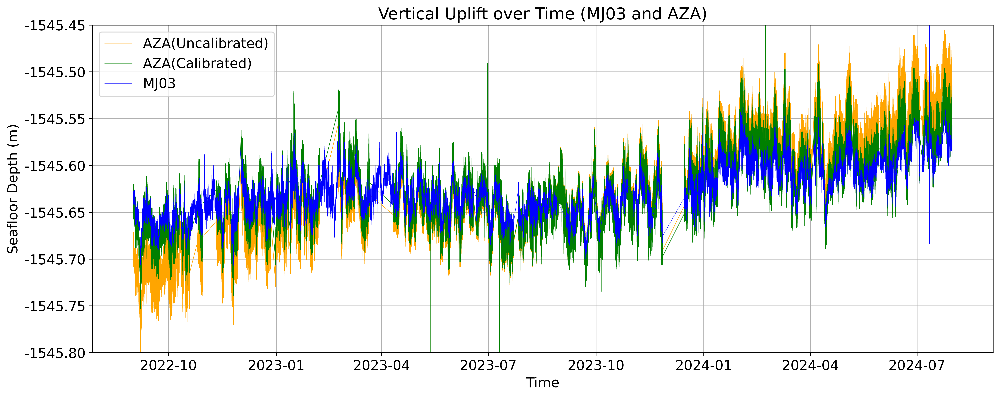

In [139]:
# Define the date range for filtering
start_date = '2022-09-01'
end_date = '2024-07-31'

# Convert date strings to datetime objects
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter the DataFrames based on the date range
filtered_df = df.loc[start_date:end_date]
filtered_combined_df4 = combined_df4[(combined_df4['DateTime'] >= start_date) & (combined_df4['DateTime'] <= end_date)]

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot vertical uplift over time
ax.plot(filtered_combined_df4['DateTime'], filtered_combined_df4['Scaled_Vertical_Raw_M'] * -1, linestyle='-', linewidth=0.5, label='AZA(Uncalibrated)', color='Orange')  # Use the DateTime column as the x-axis
ax.plot(filtered_combined_df4['DateTime'], filtered_combined_df4['vertical_uplift_m'] * -1, linestyle='-',linewidth=0.5, label='AZA(Calibrated)', color='green')  # Use the DateTime column as the x-axis
ax.plot(filtered_df.index, filtered_df['Diff_MJ_Uplift'] * -1, linestyle='-', linewidth=0.3, label='MJ03', color='blue')  # Use the index as the x-axis

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (MJ03 and AZA)')

# Set grid
ax.grid(True)

# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.set_ylim([-1545.8,-1545.45])
ax.set_aspect(aspect=800)  # Aspect ratio of 700
# Add legend
ax.legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

fig.savefig('Vertical_Uplift_Comparison.png', format='png')

# Show the plot
plt.show()


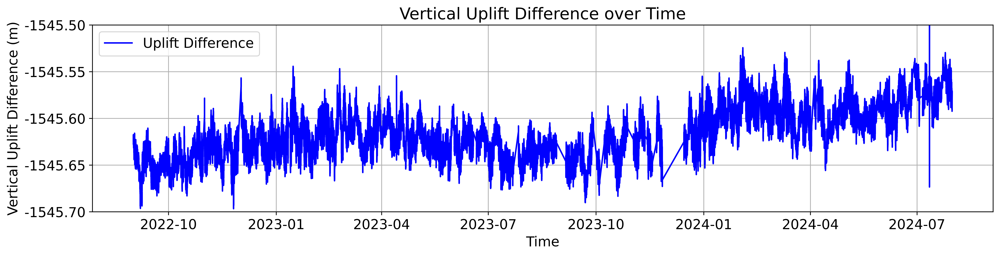

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Assuming df is already defined and 'Diff_MJ_Uplift' column has been added

# Define the date range for filtering
start_date = '2022-09-01'
end_date = '2024-07-31'

# Convert date strings to datetime objects
start_date = pd.to_datetime(start_date)
end_date = pd.to_datetime(end_date)

# Filter the DataFrame based on the date range
filtered_df = df.loc[start_date:end_date]

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)  # Increase the figure size

# Plot Diff_MJ_Uplift over time
ax.plot(filtered_df.index, filtered_df['Diff_MJ_Uplift'] * -1, linestyle='-', color='blue', label='Uplift Difference')

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Vertical Uplift Difference (m)')
ax.set_title('Vertical Uplift Difference over Time')

# Set grid
ax.grid(True)

# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.set_ylim([-1545.7,-1545.5])
ax.set_aspect(aspect=800)  # Aspect ratio of 700

 # Adjust upper limit as needed
# Add legend

ax.legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)
fig.savefig('Vertical_Uplift_MJ03.png', format='png')

# Show the plot
plt.show()


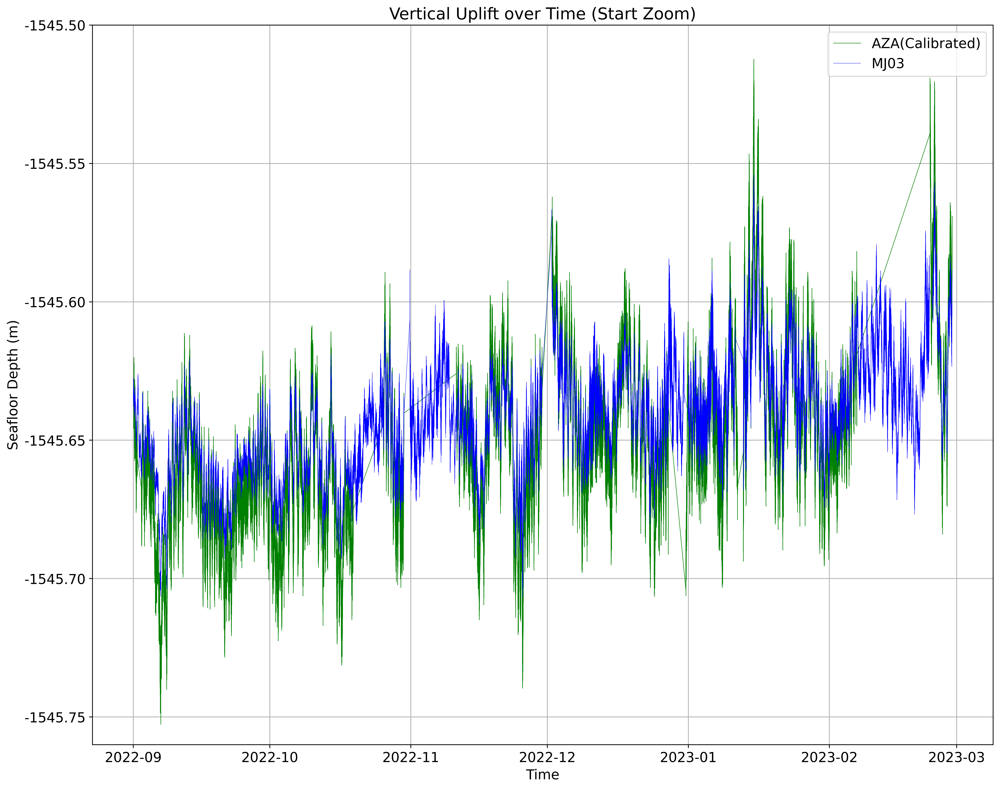

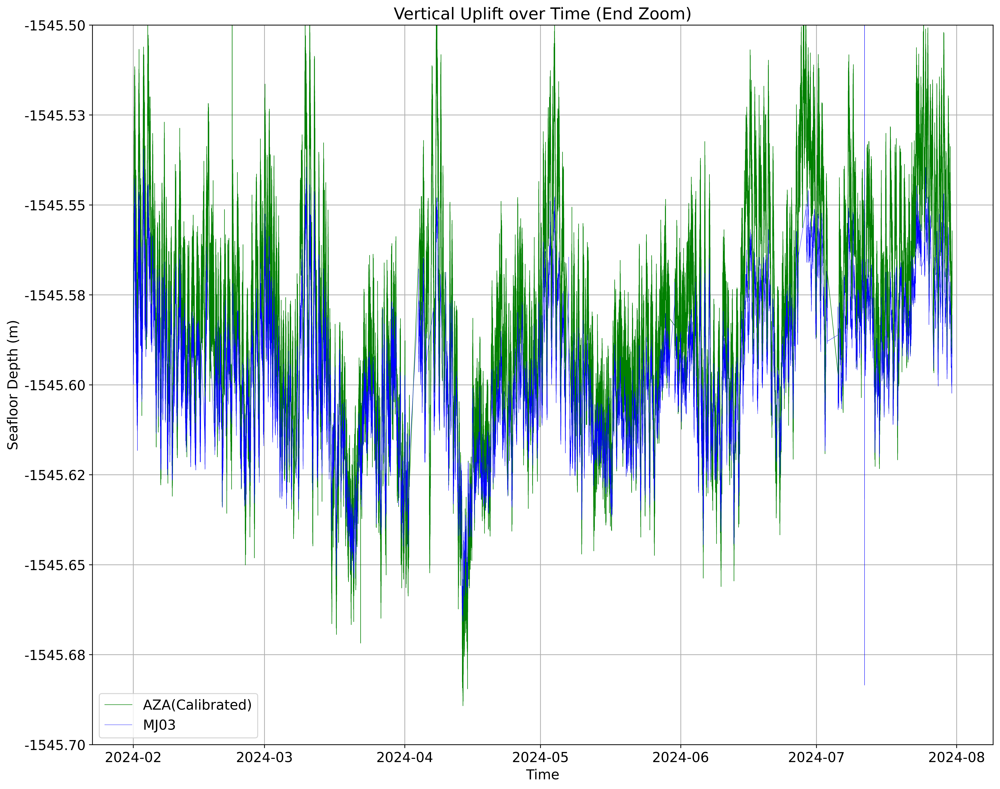

In [131]:
# Zoomed-in Plot at the Start of the Date Range
start_zoom_start = '2022-09-01'
start_zoom_end = '2023-02-28'  # Adjust this date as needed

# Convert date strings to datetime objects
start_zoom_start = pd.to_datetime(start_zoom_start)
start_zoom_end = pd.to_datetime(start_zoom_end)

# Filter the DataFrames for the zoomed-in start range
filtered_start_df = filtered_df.loc[start_zoom_start:start_zoom_end]
filtered_start_combined_df4 = filtered_combined_df4[(filtered_combined_df4['DateTime'] >= start_zoom_start) & (filtered_combined_df4['DateTime'] <= start_zoom_end)]

# Create a figure and axis for the start zoom plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)

# Plot vertical uplift over time for the zoomed-in start range
ax.plot(filtered_start_combined_df4['DateTime'], filtered_start_combined_df4['vertical_uplift_m'] * -1, linestyle='-', linewidth=0.5, label='AZA(Calibrated)', color='green')
ax.plot(filtered_start_df.index, filtered_start_df['Diff_MJ_Uplift'] * -1, linestyle='-', linewidth=0.3, label='MJ03', color='blue')

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (Start Zoom)')

# Set grid
ax.grid(True)

# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.set_ylim([-1545.76, -1545.5])

# Add legend
ax.legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Save and show the plot for the start zoom
fig.savefig('Vertical_Uplift_Comparison_Start_Zoom.png', format='png')
plt.show()

# Zoomed-in Plot at the End of the Date Range
end_zoom_start = '2024-02-01'  # Adjust this date as needed
end_zoom_end = '2024-07-31'

# Convert date strings to datetime objects
end_zoom_start = pd.to_datetime(end_zoom_start)
end_zoom_end = pd.to_datetime(end_zoom_end)

# Filter the DataFrames for the zoomed-in end range
filtered_end_df = filtered_df.loc[end_zoom_start:end_zoom_end]
filtered_end_combined_df4 = filtered_combined_df4[(filtered_combined_df4['DateTime'] >= end_zoom_start) & (filtered_combined_df4['DateTime'] <= end_zoom_end)]

# Create a figure and axis for the end zoom plot
fig, ax = plt.subplots(figsize=(16, 13), dpi=500)

# Plot vertical uplift over time for the zoomed-in end range
ax.plot(filtered_end_combined_df4['DateTime'], filtered_end_combined_df4['vertical_uplift_m'] * -1, linestyle='-', linewidth=0.5, label='AZA(Calibrated)', color='green')
ax.plot(filtered_end_df.index, filtered_end_df['Diff_MJ_Uplift'] * -1, linestyle='-', linewidth=0.3, label='MJ03', color='blue')

# Set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Seafloor Depth (m)')
ax.set_title('Vertical Uplift over Time (End Zoom)')

# Set grid
ax.grid(True)

# Set y-axis to use decimal notation
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.set_ylim([-1545.7, -1545.5])

# Add legend
ax.legend()

# Automatically adjust subplot parameters to give specified padding
plt.tight_layout(pad=5.0)

# Save and show the plot for the end zoom
fig.savefig('Vertical_Uplift_Comparison_End_Zoom.png', format='png')
plt.show()
